# Motivation

Our dataset consists of different variations of permissions involving roads in Copenhagen. There is a total of five permission types, "Moviesets", "Outdoor servings", "Signs and exhibitions", "Scaffolds and containers" and "Digging". The main focus in this analysis lies upon "Scaffolds and containers" and "Digging" as they are one of the main nuissances to people when exploring/traversing Copenhagen, but the other types are not discarded. The data can be found <a href = "http://data.kk.dk/dataset/raden-over-vej-historisk">here</a>, for this analysis we used the csv file only. Furthermore, <a href = "http://data.kk.dk/dataset/bydele/resource/35c4597f-9dfb-4d60-929d-7e6e4bc9486b">this</a> geojson was used to seperate Copenhagen into ten districts for the different visualizations.

This dataset was chosen to provide insight about how much is actually happening on the roads in Copenhagen, as it can sometimes feel like the roads/buildings are constantly under renovation/construction. This insight is hopefully provided well enough through a heatmap, k-nearest neighbour analysis and also kmeans clustering.

The heatmap is chosen as it is a very simple, but strong, visualization method to gain basic insight in the spread of the data.

K-nearest neighbour gives us an idea of predicting the permission type at a given location where the type is unknown.

And last but not least, the Kmeans clustering is done on "Scaffolds and containers" and "Digging" to see if the clusters of these types fits decently into the different districts of Copenhagen.

# Basic Stats

In [1]:
import csv
import numpy as np
import pandas as pd

from collections import Counter

import matplotlib.pyplot as plt
%matplotlib inline


So to start out we import our datafile, and it looks as following.

In [2]:
# Importing the data file
data = pd.read_csv('erhv_raaden_over_vej_samlet.csv')

In [3]:
# How the data looks like
data

,FID,adr_id,sagsnr,sagstype,status,oprettet,vejnavn,hus_nr,hus_nr_til,postnr,postnavn,projekt_start,projekt_slut,ansoeger_navn,ansoeger_kontaktpers,ansoeger_kontakttele,wkb_geometry
0,erhv_raaden_over_vej_samlet.1,12809,43504,Gravetilladelser,Godkendt,2014-12-17T12:44:52,Tuborgvej,153,157,2900,Hellerup,2004-12-18,2014-12-22,Tm-enterprise,Thomas,20358868/20358868,POINT (12.546977116464118 55.72349518628144)
1,erhv_raaden_over_vej_samlet.2,62432,15993,Gravetilladelser,Godkendt,2013-12-20T13:25:39,Stampesgade,8,8,1702,København V,2011-02-09,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.56328921689505 55.671199198613664)
2,erhv_raaden_over_vej_samlet.3,31662,15952,Gravetilladelser,Godkendt,2013-12-20T10:28:40,Haraldsgade,2,2,2200,København N,2011-02-18,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.54854675030445 55.70317565195323)
3,erhv_raaden_over_vej_samlet.4,62761,15983,Gravetilladelser,Godkendt,2013-12-20T12:55:04,Hillerødgade,13,13,2400,København N,2011-07-17,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.542493341684137 55.697313802593584)
4,erhv_raaden_over_vej_samlet.5,37434,15968,Gravetilladelser,Godkendt,2013-12-20T11:16:26,Nørrebrogade,67,67,2200,København N,2011-07-24,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.548969868877661 55.693491863798386)
5,erhv_raaden_over_vej_samlet.6,40804,15992,Gravetilladelser,Godkendt,2013-12-20T13:20:38,Store Kongensgade,84,86,1264,København K,2011-08-16,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.588531724527392 55.68505709857726)
6,erhv_raaden_over_vej_samlet.7,58795,15963,Gravetilladelser,Godkendt,2013-12-20T10:55:46,Rantzausgade,75,75,2200,København N,2011-09-08,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.542881086079653 55.68879459622318)
7,erhv_raaden_over_vej_samlet.8,4848,15997,Gravetilladelser,Godkendt,2013-12-20T13:52:43,Otto Busses Vej,5,5,2450,København SV,2011-10-03,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.55302291810283 55.66030198097407)
8,erhv_raaden_over_vej_samlet.9,63216,14856,Gravetilladelser,Godkendt,2013-11-28T14:56:18,Gammel Strand,1,1,1202,København K,2011-10-14,2018-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.579578027393913 55.67781665062758)
9,erhv_raaden_over_vej_samlet.10,72063,16029,Gravetilladelser,Godkendt,2013-12-23T09:55:08,Nordbanegade,26,26,2200,København N,2011-12-01,2015-12-31,Metroselskabet I/S,IT-enheden,33111700/33111700,POINT (12.54324605647391 55.69681604132889)


It is seen that we have 83872 observations with 17 different attributes (not all of them being used in our case due to irrelevance)

We then make a set for the different permission types used for later usage.

In [4]:
# Making a set of categories
category = set(data["sagstype"])

In [5]:
print "There are " + str(len(category)) + " different casetypes."

There are 5 different casetypes.


Counting of the number of observations in the different categories is done such that a basic histogram can be made (Used for Assignment A)

In [6]:
# Counting the number of observations of each category
countCat = Counter(data["sagstype"])

In [7]:
countCat

Counter({'Filmoptagelse': 935,
         'Gravetilladelser': 34559,
         'Skilte og vareudstillinger': 3537,
         'Stilladser og containere': 41129,
         'Udeservering': 3712})

In [8]:
#Sorting the set
sorted_c = sorted(countCat.items(), key=lambda x: x[1])

In [9]:
sorted_c

[('Filmoptagelse', 935),
 ('Skilte og vareudstillinger', 3537),
 ('Udeservering', 3712),
 ('Gravetilladelser', 34559),
 ('Stilladser og containere', 41129)]

In [10]:
plot1 = []
for i in sorted_c:
    plot1.append(i[1])

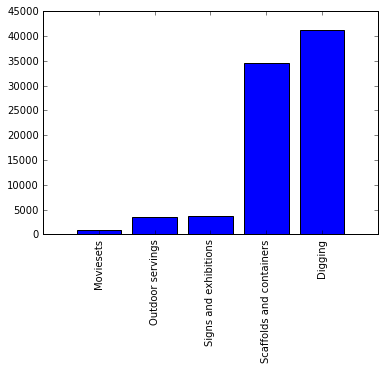

In [11]:
#Plot of the number of observations of the different categories
plt.bar(range(len(countCat)),plot1,align='center')
plt.xticks(range(len(countCat)),["Moviesets", "Outdoor servings", "Signs and exhibitions", "Scaffolds and containers", "Digging"],rotation='vertical')
plt.show()

To get a little more knowledge about our dataset, we want to look at the distribution for each permission type based on the year the permission was created.

In [12]:
#Finding the years where cases have been created
year = []
for i in data["oprettet"]:
    u = int(i.split("-")[0])
    year.append(u)

In [13]:
#Counting the number of observations for the different years
year_count = Counter(year)

In [14]:
print "Average number of permissions per year is " + str(sum(year_count.values())/float(len(year_count)))

Average number of permissions per year is 16774.4


In [15]:
Count_focus = {}
for f in category:
    Count_focus[f] = []

In [16]:
#Assigning year counts to the 5 different categories
for f in category:
    for k in range(len(data["sagstype"])):
        u = int(data["oprettet"][k].split("-")[0])
        if f == data["sagstype"][k]:
            Count_focus[f].append(int(u))

In [17]:
Count_focus2 = {}
for i in Count_focus:
    Count_focus2[i] = Counter(Count_focus[i])

In [18]:
#Printing the initial counting of the different categories, notice that some of them are missing some years.
Count_focus2

{'Filmoptagelse': Counter({2016: 716, 2017: 219}),
 'Gravetilladelser': Counter({2013: 2345,
          2014: 9567,
          2015: 9249,
          2016: 10968,
          2017: 2430}),
 'Skilte og vareudstillinger': Counter({2014: 852,
          2015: 1732,
          2016: 945,
          2017: 8}),
 'Stilladser og containere': Counter({2013: 3273,
          2014: 11060,
          2015: 10983,
          2016: 12581,
          2017: 3232}),
 'Udeservering': Counter({2014: 846, 2015: 1692, 2016: 1085, 2017: 89})}

In [19]:
from collections import defaultdict

In [20]:
#Function made to create a defaultdict for the 5 categories
def setzeros(type1,type2):
    type1new= defaultdict(int,type1)
    for key in type2:
        type1new[key]
    return type1new

In [21]:
#The defaultdict is used to fill in the missing years.
Count_focus2new ={}
for i in Count_focus2:
    Count_focus2new[i] = setzeros(Count_focus2[i],Count_focus2["Stilladser og containere"])

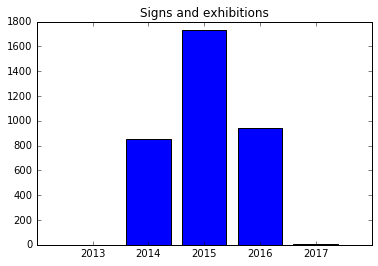

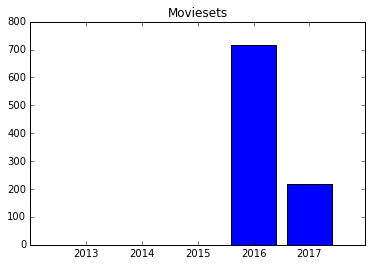

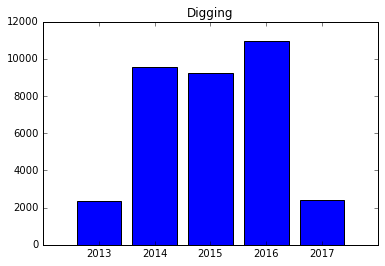

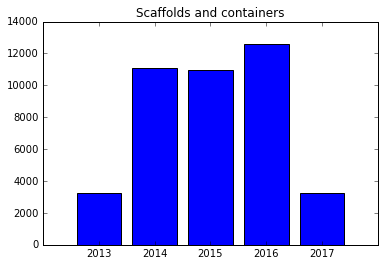

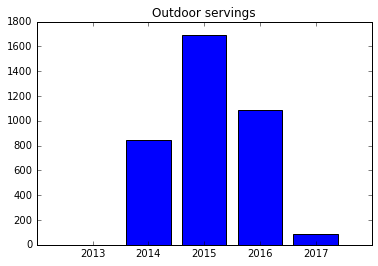

In [22]:
#Plotting the yearcounts for the 5 categories
for i in category:
    if i == "Filmoptagelse": #changing the titles to english variation
        k = "Moviesets"
        
    elif i == "Udeservering":
        k ="Outdoor servings"
        
    elif i == "Skilte og vareudstillinger":
        k = "Signs and exhibitions"
        
    elif i == "Stilladser og containere":
        k = "Scaffolds and containers"
    else:
        k = "Digging"
        
    x = Count_focus2new[i].keys()
    y = Count_focus2new[i].values()
    labels = ['2016', '2017', '2013', '2014','2015']
    plt.bar(x,y,align='center')
    plt.xticks(x, labels, rotation='horizontal')
    plt.title(k)
    plt.show()

As can be seen on the plots, most of the dataset consists of "Scaffolds and containers" and "Digging", and they are also the only ones where new cases are created in all five years. (These plots were used in Assignment A)

# Theory

Our main focus in this assignment lies upon two methods used in the course, namely K-Nearest Neighbour (KNN) classification and the K-Means Clustering. In both cases the location (longtitude and lattitude) of the road permission data is used to both test and train the models. The two methods have been chosen both for their simplicity but also because they can be nicely visualized on a map. A Multiple Regression was also tried to be done on the data, with the years the permissions were created, but the results appeared to be lacking/incorrect and thus left out of the handin.

We chose to perform the KNN classification on a total of three of our permission types, "Scaffolds and containers", "Digging", and "Outdoor servings" with both 5, 10 and 20 nearest neighbors being tried. Furthermore, a KNN classification was done on both a unbalanced set of said data, and a balanced one (There is a lot fewer observations of "Outdoor servings" compared to the other two. Then a 50x50 grid was overlayed onto the Copenhagen map showcasing what the prediction of permission type was at the different locations.
To train our KNN, we split the dataset into a training (4/5) and test (1/5) set through using train_test_split from sklearn. And also through sklearn we get a "KNNscore" indicating how good our newly trained classifier is.

For the K-means clustering, we chose to look at both "Scaffolds and containers" and "Digging" individually, with both of them being tried with 5 and 10clusters (10clusters because that is the amount of districts Copenhagen is split up in). Unlike the KNN classification, we can't in this case conclude what is "right" and "wrong" (unsupervised learning) and thus we did not use crossvalidation here, but looking at the visualization of clusters on the Copenhagen map gives a decent idea of how well the clustering went compared to our expectations.

# Visualizations

Before performing our visualizations, we preprocess some more of the data, by extracting the "wkb_geometry" string from the dataset into different sets of coordinates. Obviously this is done because working on a string of coordinates is rather cumbersome.

In [23]:
import geoplotlib
from geoplotlib.utils import BoundingBox
from geoplotlib.colors import ColorMap
import json

In [24]:
#Loading the point coordinate strings to floats
place_count = {}
for f in category:
    place_count[f] = {"lon":[],"lat":[]}

place_count_all = {"lon":[],"lat":[]}

for j in category:
    for i in range(len(data["wkb_geometry"])):
        if j == data["sagstype"][i]:
            place_count[j]["lon"].append(float(data["wkb_geometry"][i][data["wkb_geometry"][i].index("(") + 1:data["wkb_geometry"][i].rindex(")")].split(" ")[0]))
            place_count[j]["lat"].append(float(data["wkb_geometry"][i][data["wkb_geometry"][i].index("(") + 1:data["wkb_geometry"][i].rindex(")")].split(" ")[1]))
            place_count_all["lon"].append(float(data["wkb_geometry"][i][data["wkb_geometry"][i].index("(") + 1:data["wkb_geometry"][i].rindex(")")].split(" ")[0]))
            place_count_all["lat"].append(float(data["wkb_geometry"][i][data["wkb_geometry"][i].index("(") + 1:data["wkb_geometry"][i].rindex(")")].split(" ")[1]))

## Heatmaps

To start out with, we create simple heatmaps giving an idea of how the spread of data is all over Copenhagen, this part could just aswell had been in the "Basic stats" but was chosen to be put down here because of the great visualization aspects it provides.

We make a total of 4 heatmaps, one for "Scaffolds and containers", "Digging", "Outdoor servings" and one for all five permission types.

In [25]:
#Heatmap of all occurences
geoplotlib.kde(place_count_all,bw=5,cmap="rainbow")
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

box = BoundingBox(north=max(place_count_all["lat"]), west=min(place_count_all["lon"]), south=min(place_count_all["lat"]), east= max(place_count_all["lon"]))
geoplotlib.set_bbox(box)
geoplotlib.inline()
#geoplotlib.savefig("./Website/heatmap_all.png")

('smallest non-zero count', 1.4329573088768091e-09)
('max count:', 6.1457164116677818)


In [26]:
#Heatmap of Scaffolds and containers
placetype = "Stilladser og containere"
geoplotlib.kde(place_count[placetype],bw=5,cmap="rainbow")
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
geoplotlib.set_bbox(box)
geoplotlib.inline()

('smallest non-zero count', 7.1647865443840454e-10)
('max count:', 3.9113567500384177)


In [27]:
#Heatmap of Digging
placetype = "Gravetilladelser"
geoplotlib.kde(place_count[placetype],bw=5,cmap="rainbow")
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
geoplotlib.set_bbox(box)
geoplotlib.inline()

('smallest non-zero count', 7.1647865443840454e-10)
('max count:', 1.8232106474976728)


In [28]:
#Heatmap of Outdoor serving
placetype = "Udeservering"
geoplotlib.kde(place_count[placetype],bw=5,cmap="rainbow")
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
geoplotlib.set_bbox(box)
geoplotlib.inline()

('smallest non-zero count', 1.4329573088768091e-09)
('max count:', 0.9006648990265681)


Looking at all 4 heatmaps surely proves that all of our data is mainly focused at the "Center" of Copenhagen (Rådhuspladsen/København H). But it is also seen that they are decently spread all through out Copenhagen aswell. Outdoor servings has a lot fewer datapoints compared to the other two types, but still here we see a decent spread, although it makes great sense that outdoor servings is mainly at the center of town because of tourists etc.

## Unbalanced KNN

When looking into the KNN classification, we start out by doing it upon a unbalanced (the original) version of our data.

To start out with, we create an array of the longtitude and lattidudes for the three types, where the array is ordered is such a way that all the "Scaffolds and containers" is at the start of the array, followed by "Digging" and then "Outdoor servings"

In [29]:
coordlat = place_count["Stilladser og containere"]["lat"] + place_count["Gravetilladelser"]["lat"] + place_count["Udeservering"]["lat"]
coordlon = place_count["Stilladser og containere"]["lon"] + place_count["Gravetilladelser"]["lon"] +place_count["Udeservering"]["lon"]

In [30]:
coordinates = np.column_stack((coordlon,coordlat))
coordinates

array([[ 12.60116392,  55.65920555],
       [ 12.58471092,  55.70135277],
       [ 12.55975961,  55.67407433],
       ..., 
       [ 12.60147639,  55.6630993 ],
       [ 12.55949898,  55.66867085],
       [ 12.58329477,  55.69376056]])

Then a list is created of the targets corresponding to each coordinate said in the array from above. From this point on 0 is the value of "Scaffolds and containers", 1 is the value for "Digging" and 2 for "Outdoor servings"

In [31]:
#Creation of the targets for the classifier
target = [0 for _ in range(len(place_count["Stilladser og containere"]["lat"]))]
target.extend([1 for _ in range(len(place_count["Gravetilladelser"]["lat"]))])
target.extend([2 for _ in range(len(place_count["Udeservering"]["lat"]))])

In [32]:
from sklearn import neighbors
from sklearn.cross_validation import train_test_split

We then perform the KNN with 5, 10 and 20 neighbours on the array and the corresponding target, but first the data is split up into training/test

In [33]:
#Setting up the 3 classifiers we perform
knn5=neighbors.KNeighborsClassifier(n_neighbors=5)
knn10=neighbors.KNeighborsClassifier(n_neighbors=10)
knn20=neighbors.KNeighborsClassifier(n_neighbors=20)

In [34]:
#Splitting the dataset into test and training sets
X_train, X_test, y_train, y_test = train_test_split(coordinates,target,test_size=0.2,random_state = 0)

In [35]:
#Fitting the classifiers
knn5.fit(X_train,y_train)
knn10.fit(X_train,y_train)
knn20.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=20, p=2,
           weights='uniform')

In [36]:
#printing of the inbuilt score system
print knn5.score(X_test,y_test)
print knn10.score(X_test,y_test)
print knn20.score(X_test,y_test)

0.681423173804
0.667191435768
0.653652392947


Looking at the inbuilt KNN scores, we see that of our three classifiers the 5 neighbours gives the best result (We classify the targets more correctly here)

We then want to visualize the results, which is done by assigning a 50x50 grid overlay to the Copenhagen map

In [37]:
#Grid
north = max(place_count_all["lat"])
west = max(place_count_all["lon"])
south = min(place_count_all["lat"])
east = min(place_count_all["lon"])

xx = np.linspace(east,west,50)
yy = np.linspace(south,north,50)

xx,yy = np.meshgrid(xx,yy)

In [38]:
grid = np.c_[xx.ravel(), yy.ravel()]

In [39]:
#Prediction based on the grid
Z_full5 = knn5.predict(grid)
Z_full10 = knn10.predict(grid)
Z_full20 = knn20.predict(grid)

In [40]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 5 neighbours
target5_0 = {"lon":[],"lat":[]}
target5_1 = {"lon":[],"lat":[]}
target5_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full5)):
    if Z_full5[i] == 0:
        target5_0["lon"].append(grid[i][0])
        target5_0["lat"].append(grid[i][1])
    elif Z_full5[i] == 1:
        target5_1["lon"].append(grid[i][0])
        target5_1["lat"].append(grid[i][1])
    else:
        target5_2["lon"].append(grid[i][0])
        target5_2["lat"].append(grid[i][1])

In [41]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 10 neighbours
target10_0 = {"lon":[],"lat":[]}
target10_1 = {"lon":[],"lat":[]}
target10_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full10)):
    if Z_full10[i] == 0:
        target10_0["lon"].append(grid[i][0])
        target10_0["lat"].append(grid[i][1])
    elif Z_full10[i] == 1:
        target10_1["lon"].append(grid[i][0])
        target10_1["lat"].append(grid[i][1])
    else:
        target10_2["lon"].append(grid[i][0])
        target10_2["lat"].append(grid[i][1])

In [42]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 20 neighbours
target20_0 = {"lon":[],"lat":[]}
target20_1 = {"lon":[],"lat":[]}
target20_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full5)):
    if Z_full20[i] == 0:
        target20_0["lon"].append(grid[i][0])
        target20_0["lat"].append(grid[i][1])
    elif Z_full20[i] == 1:
        target20_1["lon"].append(grid[i][0])
        target20_1["lat"].append(grid[i][1])
    else:
        target20_2["lon"].append(grid[i][0])
        target20_2["lat"].append(grid[i][1])

In [43]:
#Plot of the KNN with 5 neighbours
geoplotlib.dot(target5_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target5_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target5_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn5_nonb.png")

In [44]:
#Plot of the KNN with 10 neighbours
geoplotlib.dot(target10_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target10_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target10_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn10_nonb.png")

In [45]:
#Plot of the KNN with 20 neighbours
geoplotlib.dot(target20_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target20_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target20_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn20_nonb.png")

First of it, it should be said, that only the data close/inside of the city districts really make sense to look at, furthermore "Frederiksberg" is not a part of Copenhagen but is still covered by the grid, so these values should be discarded.

It is seen overall that red (Scaffolds and containers) and green (Digging) mainly dominates the classiflier compared to blue (Outdoor serving). And that there isn't that much of a difference between using 5, 10 or 20neighbours, except of the fact that some of the blue dots are replaced with either green or red.

## Balanced KNN

For the balanced KNN, we perform the exact same as above, except this time we make sure that there is equal amounts of data of each permission type, thus we randomly pick some data from "Scaffolds and containers" and "Digging" until the same size as "Outdoor servings" is obtained.

In [46]:
#Seed chosen
np.random.seed(seed=1337)

In [47]:
#Take random observations
rand_Scaff = np.random.permutation(len(place_count["Stilladser og containere"]["lat"]))[:len(place_count["Udeservering"]["lat"])]
rand_Dig = np.random.permutation(len(place_count["Gravetilladelser"]["lat"]))[:len(place_count["Udeservering"]["lat"])]

In [48]:
#Creating the same type of array as before, but this time balanced
data_balanced = [[place_count["Stilladser og containere"]["lon"][i],place_count["Stilladser og containere"]["lat"][i]] \
                 for i in rand_Scaff]

data_balanced.extend([[place_count["Gravetilladelser"]["lon"][i],place_count["Gravetilladelser"]["lat"][i]] \
                 for i in rand_Dig])

data_balanced.extend([[place_count["Udeservering"]["lon"][i],place_count["Udeservering"]["lat"][i]] \
      for i in range(len(place_count["Udeservering"]["lat"]))])

data_balanced = np.array(data_balanced)

In [49]:
#Again creating the target list
target = [0 for _ in range(len(rand_Scaff))]
target.extend([1 for _ in range(len(rand_Dig))])
target.extend([2 for _ in range(len(place_count["Udeservering"]["lat"]))])

In [50]:
#Setting up the classifliers
knn5=neighbors.KNeighborsClassifier(n_neighbors=5)
knn10=neighbors.KNeighborsClassifier(n_neighbors=10)
knn20=neighbors.KNeighborsClassifier(n_neighbors=20)

In [51]:
#Splitting the balanced dataset into test and training
X_train, X_test, y_train, y_test = train_test_split(data_balanced,target,test_size=0.2,random_state = 0)

In [52]:
#Fitting the three classifiers
knn5.fit(X_train,y_train)
knn10.fit(X_train,y_train)
knn20.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=20, p=2,
           weights='uniform')

In [53]:
#Printing the inbuilt score values
print knn5.score(X_test,y_test)
print knn10.score(X_test,y_test)
print knn20.score(X_test,y_test)

0.617594254937
0.596499102334
0.577648114901


Looking at the scores for the balanced KNN, we immediately see that all the scores are lower than for the unbalanced variation. Thus the unbalanced variation is simply better at predicting the permission types.

Just as before, we again visualize the results with a map of Copenhagen and a 50x50 grid.

In [54]:
#Grid
north = max(place_count_all["lat"])
west = max(place_count_all["lon"])
south = min(place_count_all["lat"])
east = min(place_count_all["lon"])

xx = np.linspace(east,west,50)
yy = np.linspace(south,north,50)

xx,yy = np.meshgrid(xx,yy)

In [55]:
grid = np.c_[xx.ravel(), yy.ravel()]

In [56]:
#Prediction based on the grid
Z_full5 = knn5.predict(grid)
Z_full10 = knn10.predict(grid)
Z_full20 = knn20.predict(grid)

In [57]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 5 neighbours
target5_0 = {"lon":[],"lat":[]}
target5_1 = {"lon":[],"lat":[]}
target5_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full5)):
    if Z_full5[i] == 0:
        target5_0["lon"].append(grid[i][0])
        target5_0["lat"].append(grid[i][1])
    elif Z_full5[i] == 1:
        target5_1["lon"].append(grid[i][0])
        target5_1["lat"].append(grid[i][1])
    else:
        target5_2["lon"].append(grid[i][0])
        target5_2["lat"].append(grid[i][1])

In [58]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 10 neighbours
target10_0 = {"lon":[],"lat":[]}
target10_1 = {"lon":[],"lat":[]}
target10_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full10)):
    if Z_full10[i] == 0:
        target10_0["lon"].append(grid[i][0])
        target10_0["lat"].append(grid[i][1])
    elif Z_full10[i] == 1:
        target10_1["lon"].append(grid[i][0])
        target10_1["lat"].append(grid[i][1])
    else:
        target10_2["lon"].append(grid[i][0])
        target10_2["lat"].append(grid[i][1])

In [59]:
#Assigning grid values 0,1,2 depending on which type is found at said point for the KNN with 20 neighbours
target20_0 = {"lon":[],"lat":[]}
target20_1 = {"lon":[],"lat":[]}
target20_2 = {"lon":[],"lat":[]}
for i in range(len(Z_full5)):
    if Z_full20[i] == 0:
        target20_0["lon"].append(grid[i][0])
        target20_0["lat"].append(grid[i][1])
    elif Z_full20[i] == 1:
        target20_1["lon"].append(grid[i][0])
        target20_1["lat"].append(grid[i][1])
    else:
        target20_2["lon"].append(grid[i][0])
        target20_2["lat"].append(grid[i][1])

In [60]:
#Plot of the KNN with 5 neighbours with a balanced dataset
geoplotlib.dot(target5_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target5_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target5_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn5_b.png")

In [61]:
#Plot of the KNN with 10 neighbours with a balanced dataset
geoplotlib.dot(target10_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target10_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target10_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn10_b.png")

In [62]:
#Plot of the KNN with 20 neighbours with a balanced dataset
geoplotlib.dot(target20_0,color=[250,0,0],point_size=3) # Scaffolds and containers(red)
geoplotlib.dot(target20_1,color=[0,250,0],point_size=3) # Digging (Green)
geoplotlib.dot(target20_2,color=[0,0,250],point_size=3) # Outdoor serving (Blue)
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)

geoplotlib.inline()
geoplotlib.savefig("./Website/knn/knn20_b.png")

The first thing to notice is the immense increase of "Outdoor servings" (blue) in the center of Copenhagen, furthermore the "Digging" has been quite suppresed in the center aswell. But it should be said, that this is obviously a very skewed way to look at our dataset, because the very low amount of "Outdoor servings" makes us trim away a large amount of data at random. Which in theory could result in some areas where either "Scaffold and containers" or "Digging" should be dominant, but instead they simply aren't "there" anymore.

# Kmeans

In this section, we peform K-means clustering on both the "Scaffolds and containers" and "Digging" datasets individually with 5 and 10 clusters. To do this, the wanted data first gets extracted and turned into an array of Longtitude, Lattitude.

In [63]:
from sklearn.cluster import KMeans

In [64]:
#Extraction of Scaffolds and containers data, stacked into a lon,lat array
coordinates_KM_Scaffolds = np.column_stack((place_count["Stilladser og containere"]["lon"],place_count["Stilladser og containere"]["lat"]))

In [65]:
#Performing the Kmeans with 5 clusters on Scaffolds and containers
K = KMeans(n_clusters=5)
K.fit(coordinates_KM_Scaffolds)
    
groups = {}
labels = K.labels_
centers = K.cluster_centers_
for i in range(len(labels)):
    if labels[i] not in groups:
        groups[labels[i]] = []
            
    groups[labels[i]].append([coordinates_KM_Scaffolds[i][0],coordinates_KM_Scaffolds[i][1]])

In [66]:
#For saving the data
p_dict = {"labels" : labels, "X" : coordinates_KM_Scaffolds[:,0], "Y" : coordinates_KM_Scaffolds[:,1]}
datasave = pd.DataFrame(p_dict)
for i in range(5):
    temp = datasave[datasave["labels"]==i]
    temp.to_csv("./Website/kmeans/Cluster_k5_"+ str(i) +".csv")
    
centroids = {"Xc" : centers[:,0], \
                    "Yc" : centers[:,1]} 
d2 = pd.DataFrame(centroids) 
d2.to_csv("./Website/kmeans/Centroids_k5.csv")

In [67]:
#Creation of a list of colour, one for each cluster
colors = [[255,0,0],[0,255,0],[0,0,255],[255,255,0],[255,0,255]]

In [68]:
#Plot of the 5 clusters of "Scaffolds on containers" with the Copenhagen map underneath.
plot_cluster = {}
placetype = "Stilladser og containere"
box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
c = 0
for i in groups:
    temp = np.array(groups[i])
    plot = {"lat" : temp[:,1].tolist() , "lon" : temp[:,0].tolist()}
    geoplotlib.dot(plot,color=colors[c],point_size=3)
    c += 1
        
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)
geoplotlib.set_bbox(box)
geoplotlib.inline()
geoplotlib.savefig("./Website/kmeans/kmeans5.png")

It is seen that the clusters kinda represent different parts of Copenhagen, but not exactly fitting with the actual city district lines (Must be remembered that the citylines is not originally from the same dataset). But the clusters do have some merit, as the red for example is basically the center of Copenhagen together with Østerbro. After seeing this plot, we concluded that it could be fun to try with 10 clusters and see if it would be even closer to fitting the districts.

In [69]:
#Kmeans with 10clusters on Scaffolds and containers
K = KMeans(n_clusters=10)
K.fit(coordinates_KM_Scaffolds)
    
groups = {}
labels = K.labels_
centers = K.cluster_centers_
for i in range(len(labels)):
    if labels[i] not in groups:
        groups[labels[i]] = []
            
    groups[labels[i]].append([coordinates_KM_Scaffolds[i][0],coordinates_KM_Scaffolds[i][1]])

In [70]:
#For saving the data
p_dict = {"labels" : labels, "X" : coordinates_KM_Scaffolds[:,0], "Y" : coordinates_KM_Scaffolds[:,1]}
datasave = pd.DataFrame(p_dict)
for i in range(5):
    temp = datasave[datasave["labels"]==i]
    temp.to_csv("./Website/kmeans/Cluster_k10_"+ str(i) +".csv")
    
centroids = {"Xc" : centers[:,0], \
                    "Yc" : centers[:,1]} 
d2 = pd.DataFrame(centroids) 
d2.to_csv("./Website/kmeans/Centroids_k10.csv")

In [71]:
#Colour list, one for each cluster
colors = [[255,0,0],[0,255,0],[0,0,255],[255,255,0],[255,0,255],[0,255,255],[165,255,165],[165,0,255],[255,0,165],[100,100,100]]

In [72]:
#Plotting the Clusters from Kmeans with 10clusters for Scaffolds and containers
plot_cluster = {}

box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
c = 0
for i in groups:
    temp = np.array(groups[i])
    plot = {"lat" : temp[:,1].tolist() , "lon" : temp[:,0].tolist()}
    geoplotlib.dot(plot,color=colors[c],point_size=3)
    c += 1
        
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)
geoplotlib.set_bbox(box)
geoplotlib.inline()
geoplotlib.savefig("./Website/kmeans/kmeans10.png")

It almost fits the districts! It turns out that 10 clusters only really "screw up" one cluster by placing a secondary cluster inside of the center of Copenhagen, instead of splitting the yellow one into two pieces. Obviously it's not 100% perfect as can be seen by some colours overlapping into the other districts but it looks really good!

We then also did the same on the "Digging" dataset, but the results turn out to be almost identical (which is most likely a good thing). The way it is done is exactly the same as above, so comments in this part have been left out

In [73]:
#Extracting the Digging data into a lon,lat array
coordinates_KM_Digging = np.column_stack((place_count["Gravetilladelser"]["lon"],place_count["Gravetilladelser"]["lat"]))

In [74]:
#Perform Kmeans with 5 clusters on Digging
K = KMeans(n_clusters=5)
K.fit(coordinates_KM_Digging)
    
groups = {}
labels = K.labels_
centers = K.cluster_centers_
for i in range(len(labels)):
    if labels[i] not in groups:
        groups[labels[i]] = []
            
    groups[labels[i]].append([coordinates_KM_Digging[i][0],coordinates_KM_Digging[i][1]])

In [75]:
#Color list, one for each cluster
colors = [[255,0,0],[0,255,0],[0,0,255],[255,255,0],[255,0,255]]

In [76]:
#Plotting the 5 clusters of Kmeans done on Digging
plot_cluster = {}
placetype = "Gravetilladelser"
box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
c = 0
for i in groups:
    temp = np.array(groups[i])
    plot = {"lat" : temp[:,1].tolist() , "lon" : temp[:,0].tolist()}
    geoplotlib.dot(plot,color=colors[c],point_size=3)
    c += 1
        
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)
geoplotlib.set_bbox(box)
geoplotlib.inline()

In [77]:
#Perform Kmeans with 10 clusters on Digging
K = KMeans(n_clusters=10)
K.fit(coordinates_KM_Digging)
    
groups = {}
labels = K.labels_
centers = K.cluster_centers_
for i in range(len(labels)):
    if labels[i] not in groups:
        groups[labels[i]] = []
            
    groups[labels[i]].append([coordinates_KM_Digging[i][0],coordinates_KM_Digging[i][1]])

In [78]:
#Color list, one for each cluster
colors = [[255,0,0],[0,255,0],[0,0,255],[255,255,0],[255,0,255],[0,255,255],[165,255,165],[165,0,255],[255,0,165],[100,100,100]]

In [79]:
#Plotting the 10 clusters of Kmeans done on Digging
plot_cluster = {}
placetype = "Gravetilladelser"
box = BoundingBox(north=max(place_count[placetype]["lat"]), west=min(place_count[placetype]["lon"]), south=min(place_count[placetype]["lat"]), east= max(place_count[placetype]["lon"]))
c = 0
for i in groups:
    temp = np.array(groups[i])
    plot = {"lat" : temp[:,1].tolist() , "lon" : temp[:,0].tolist()}
    geoplotlib.dot(plot,color=colors[c],point_size=3)
    c += 1
        
geoplotlib.geojson("bydele.geojson",linewidth=4,color="black",fill=False)
geoplotlib.set_bbox(box)
geoplotlib.inline()

# Discussion

We think that the chosen models gives a decent impression of how the road permission data is represented in Copenhagen.

Our KNN models were able to most of the time predict the correct type of permission depending on location. We also learnt that with this dataset, the KNN classifier becomes worse by balancing the dataset. Obviously we haven't done an intensive check of the optimal number of neighbours, so this could be an improvement to the KNN. But overall the KNN was satisfying, as it gives an impression of the difference between a balanced and nonbalanced dataset.

Looking at the Kmeans clustering, we were really satisfied by the fact that they almost cover the districts correctly. It was also nice to see that the kmeans clustering were basically the same for "Scaffolds and containers" and "Digging". Sadly the dataset has another way to differentiate between districts, thus we couldn't really give an estimate number of of how many points were coloured correctly. Furthermore, the K was chosen to be 5 as its a simple starting point, but the chose of 10 made sense because of the 10 districts. There is most likely some ways to determine a more correct K value but, this was sadly not discussed in the course.

As it was shortly mentioned in the Theory section, a Multiple regression was tried on the creation years of permission and the permission type. Sadly the results were nonsense.


Overall, the models etc. worked. But it could had maybe been smart to choose a larger dataset, or a dataset with more concrete attributes (closer to the crime dataset used in earlier assignments)